In [1]:
#!/usr/bin/env python

import argparse
import os
import sys
from dataclasses import dataclass


import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import savemat
from scipy.integrate import solve_ivp


THIS_DIR = os.path.dirname(os.path.abspath("__file__"))
PARENT_DIR = os.path.dirname(os.path.dirname(os.path.abspath("__file__")))
sys.path.append(PARENT_DIR)

import data_gen
import data_gen_dissipative

import modules_quad_stable as module
import plots_helper as plot
import utils

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if device.type == "cpu":
    print("No GPU found!")
else:
    print("Great, a GPU is there")
print("=" * 50)

# For reproducibility
utils.reproducibility_seed(seed=42)

# Plotting setting
prop_cycle = plt.rcParams["axes.prop_cycle"]
colors = prop_cycle.by_key()["color"]

plt.rc("font", size=20)  # controls default text size
plt.rc("axes", titlesize=20)  # fontsize of the title
plt.rc("axes", labelsize=20)  # fontsize of the x and y labels
plt.rc("xtick", labelsize=20)  # fontsize of the x tick labels
plt.rc("ytick", labelsize=20)  # fontsize of the y tick labels
plt.rc("legend", fontsize=15)  # fontsize of the legend

# Define the parameters
@dataclass
class Parameters:
    """It contain necessary parameters for this example."""

    t_train: float = 10.0  # Training final time
    t_test: float = 10.0  # Testing final time
    Nt: int = 10  # Number initial conditions of training samples
    Ntest: int = 100  # Number initial conditions of testing samples
    canonical_dim: int = 2 # canonical dimension
    latent_dim: int = 4 # latent canonical dimensional
    hidden_dim: int = 16 # number of neurons in a hidden layer
    smpling_intl = [-1.5, 1.5]  # sampling interval
    sample_size: int = 200 # number of samples in a given training time interval
    batch_size: int = 64 # batch size
    max_potential = 4  # max potential to generate training data
    learning_rate: float = 3e-3  # Learning rate
    encoder: str = "MLP" # type of neural network
    confi_model: str = None # model configuration
    epoch: int = None # number of epochs which are externally controlled
    path: str = None # path where the results will be save and it is also externally controlled
    loss_weights: tuple = (1.0,1.0)

Great, a GPU is there


In [2]:
# Prepare learned models for integration
def learned_model(t, x):
    """It yields time-derivative of x at time t.
    It is obtained throught the time-derivative of Hamiltonian function.

    Args:
        t (float): time
        x (float): state variable containing position and momenta.

    Returns:
        float: time-derivative of x
    """
    x = torch.tensor(
        x.reshape(-1, params.latent_dim), dtype=torch.float64, requires_grad=True
    ).to(device)
    y = vf.vector_field(x)
    y = y.detach()
    return y.cpu().numpy()


def plotting_saving_plots_phasespace(
    gt_sol,
    decoded_latent_sol,
    color_idx,
    method_name,
    idx,
    path="",
    closing_plts=True,
):
    
    fig, ax = plt.subplots(1, 1, figsize=(4, 3))
    ax.plot(gt_sol.T[:, 0], gt_sol.T[:, 1], linestyle = 'None', marker = 'o', markevery = 10, color='k')
    plt.xlabel("q")
    plt.ylabel("p")

    ax.plot(decoded_latent_sol.T[:, 0], decoded_latent_sol.T[:, 1], color=colors[color_idx])
    plt.title(method_name)
    plt.tight_layout()
    

    fig.savefig(
        path + f"plot_learned_ps_{idx}.png",
        dpi=300,
        bbox_inches="tight",
        pad_inches=0.1,
    )
    
    if closing_plts:
        plt.close("all")

In [3]:
params = Parameters()

# Taking external inputs
parser = argparse.ArgumentParser()

parser.add_argument(
    "--confi_model",
    type=str,
    default="quad",
    choices={"linear", "quad", "linear_nostability", "quad_opinf"},
    help="Enforcing model hypothesis",
)

parser.add_argument("--epochs", type=int, default=1200, help="Number of epochs")

args = parser.parse_args([])

params.confi_model = args.confi_model
params.epoch = args.epochs
params.path = "./../Results/Pendulum/" + params.confi_model + "/"

if not os.path.exists(params.path):
    os.makedirs(params.path)
    print("The new directory is created as " + params.path)

In [4]:
# Generating data
dyn_model_dissipative = data_gen_dissipative.LVExampleDissipative()

# Obtaining the data
x_train, t_train = data_gen_dissipative.get_data(params, dyn_model_dissipative)
# Create data loaders. Note that the data contains both state and derivative information.
train_dl_dissipative = data_gen.data_loader(x_train, t_train, dyn_model_dissipative.vector_field, params)

/scratch/Goyalp/Manucripts/2023_Manuscript/generalized_quad_embeddings/Code_v2/data_gen_dissipative.py:58: RuntimeWarning: overflow encountered in exp
  dqdt = 1 - np.exp(p) - 0.05*q


In [5]:
t_train.shape, x_train.shape

((200,), (2000, 2))

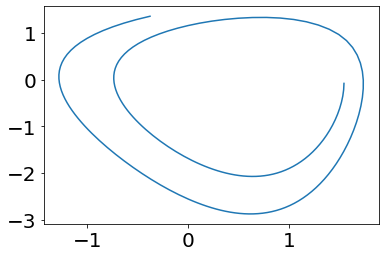

In [6]:
# plt.plot(t_train, x_train[:params.sample_size])
plt.plot(x_train[:params.sample_size,0], x_train[:params.sample_size,1])

In [7]:
params

Parameters(t_train=10.0, t_test=10.0, Nt=10, Ntest=100, canonical_dim=2, latent_dim=4, hidden_dim=16, sample_size=200, batch_size=64, learning_rate=0.003, encoder='MLP', confi_model='quad', epoch=1200, path='./../Results/Pendulum/quad/', loss_weights=(1.0, 1.0))

In [8]:
models = module.network_models(params)
optim = torch.optim.Adam(
    [
        {
            "params": models["ae"].parameters(),
            "lr": params.learning_rate,
            "weight_decay": 1e-5,
        },
        {
            "params": models["vf"].parameters(),
            "lr": params.learning_rate,
            "weight_decay": 1e-5,
        },
    ]
)

Nonlinear autoencoder and quadratic system with Gaurantee stability!
Global Stability Gurantees!
B_term: False


In [9]:
# Obtain Hamiltonian function, autoencoder, transformation and loss error
models, err_t = module.train_quad(models, train_dl_dissipative, optim, params)



Training begins!
weights for loss function are: (1.0, 1.0)
Epoch 1/1200 | loss_VF: 1.46e-01 | loss_AE: 1.10e-01 | learning rate: 3.00e-03
Epoch 2/1200 | loss_VF: 3.96e-02 | loss_AE: 1.74e-02 | learning rate: 3.00e-03
Epoch 3/1200 | loss_VF: 3.54e-02 | loss_AE: 1.34e-02 | learning rate: 3.00e-03
Epoch 4/1200 | loss_VF: 5.19e-02 | loss_AE: 2.36e-02 | learning rate: 3.00e-03
Epoch 5/1200 | loss_VF: 3.06e-02 | loss_AE: 1.15e-02 | learning rate: 3.00e-03
Epoch 6/1200 | loss_VF: 2.60e-02 | loss_AE: 1.39e-02 | learning rate: 3.00e-03
Epoch 7/1200 | loss_VF: 2.86e-02 | loss_AE: 1.50e-02 | learning rate: 3.00e-03
Epoch 8/1200 | loss_VF: 1.50e-02 | loss_AE: 1.43e-02 | learning rate: 3.00e-03
Epoch 9/1200 | loss_VF: 1.10e-02 | loss_AE: 8.67e-03 | learning rate: 3.00e-03
Epoch 10/1200 | loss_VF: 2.04e-02 | loss_AE: 1.11e-02 | learning rate: 3.00e-03
Epoch 11/1200 | loss_VF: 1.56e-02 | loss_AE: 1.55e-02 | learning rate: 3.00e-03
Epoch 12/1200 | loss_VF: 1.19e-02 | loss_AE: 1.05e-02 | learning rate:

Epoch 103/1200 | loss_VF: 5.22e-03 | loss_AE: 8.37e-03 | learning rate: 3.00e-03
Epoch 104/1200 | loss_VF: 4.78e-03 | loss_AE: 6.84e-03 | learning rate: 3.00e-03
Epoch 105/1200 | loss_VF: 5.26e-03 | loss_AE: 8.19e-03 | learning rate: 3.00e-03
Epoch 106/1200 | loss_VF: 4.66e-03 | loss_AE: 7.44e-03 | learning rate: 3.00e-03
Epoch 107/1200 | loss_VF: 3.74e-03 | loss_AE: 4.11e-03 | learning rate: 3.00e-03
Epoch 108/1200 | loss_VF: 2.50e-03 | loss_AE: 6.32e-03 | learning rate: 3.00e-03
Epoch 109/1200 | loss_VF: 2.70e-03 | loss_AE: 3.55e-03 | learning rate: 3.00e-03
Epoch 110/1200 | loss_VF: 3.26e-03 | loss_AE: 6.34e-03 | learning rate: 3.00e-03
Epoch 111/1200 | loss_VF: 1.97e-03 | loss_AE: 6.84e-03 | learning rate: 3.00e-03
Epoch 112/1200 | loss_VF: 3.53e-03 | loss_AE: 5.17e-03 | learning rate: 3.00e-03
Epoch 113/1200 | loss_VF: 4.06e-03 | loss_AE: 4.96e-03 | learning rate: 3.00e-03
Epoch 114/1200 | loss_VF: 3.19e-03 | loss_AE: 7.34e-03 | learning rate: 3.00e-03
Epoch 115/1200 | loss_VF: 4.

Epoch 205/1200 | loss_VF: 2.74e-03 | loss_AE: 8.53e-03 | learning rate: 3.00e-03
Epoch 206/1200 | loss_VF: 4.03e-03 | loss_AE: 5.71e-03 | learning rate: 3.00e-03
Epoch 207/1200 | loss_VF: 3.76e-03 | loss_AE: 5.70e-03 | learning rate: 3.00e-03
Epoch 208/1200 | loss_VF: 2.36e-03 | loss_AE: 6.25e-03 | learning rate: 3.00e-03
Epoch 209/1200 | loss_VF: 4.06e-03 | loss_AE: 5.36e-03 | learning rate: 3.00e-03
Epoch 210/1200 | loss_VF: 4.49e-03 | loss_AE: 5.21e-03 | learning rate: 3.00e-03
Epoch 211/1200 | loss_VF: 2.94e-03 | loss_AE: 7.36e-03 | learning rate: 3.00e-03
Epoch 212/1200 | loss_VF: 2.82e-03 | loss_AE: 6.94e-03 | learning rate: 3.00e-03
Epoch 213/1200 | loss_VF: 3.99e-03 | loss_AE: 6.04e-03 | learning rate: 3.00e-03
Epoch 214/1200 | loss_VF: 3.39e-03 | loss_AE: 7.05e-03 | learning rate: 3.00e-03
Epoch 215/1200 | loss_VF: 2.93e-03 | loss_AE: 5.63e-03 | learning rate: 3.00e-03
Epoch 216/1200 | loss_VF: 2.20e-03 | loss_AE: 3.99e-03 | learning rate: 3.00e-03
Epoch 217/1200 | loss_VF: 2.

Epoch 307/1200 | loss_VF: 2.08e-03 | loss_AE: 7.87e-03 | learning rate: 3.00e-03
Epoch 308/1200 | loss_VF: 2.43e-03 | loss_AE: 5.32e-03 | learning rate: 3.00e-03
Epoch 309/1200 | loss_VF: 1.74e-03 | loss_AE: 4.77e-03 | learning rate: 3.00e-03
Epoch 310/1200 | loss_VF: 2.58e-03 | loss_AE: 4.92e-03 | learning rate: 3.00e-03
Epoch 311/1200 | loss_VF: 1.69e-03 | loss_AE: 5.60e-03 | learning rate: 3.00e-03
Epoch 312/1200 | loss_VF: 1.52e-03 | loss_AE: 5.51e-03 | learning rate: 3.00e-03
Epoch 313/1200 | loss_VF: 2.20e-03 | loss_AE: 2.89e-03 | learning rate: 3.00e-03
Epoch 314/1200 | loss_VF: 1.71e-03 | loss_AE: 5.39e-03 | learning rate: 3.00e-03
Epoch 315/1200 | loss_VF: 2.04e-03 | loss_AE: 5.09e-03 | learning rate: 3.00e-03
Epoch 316/1200 | loss_VF: 2.15e-03 | loss_AE: 4.18e-03 | learning rate: 3.00e-03
Epoch 317/1200 | loss_VF: 1.87e-03 | loss_AE: 2.89e-03 | learning rate: 3.00e-03
Epoch 318/1200 | loss_VF: 3.01e-03 | loss_AE: 4.02e-03 | learning rate: 3.00e-03
Epoch 319/1200 | loss_VF: 2.

Epoch 409/1200 | loss_VF: 2.05e-03 | loss_AE: 7.04e-03 | learning rate: 3.00e-03
Epoch 410/1200 | loss_VF: 1.20e-03 | loss_AE: 2.75e-03 | learning rate: 3.00e-03
Epoch 411/1200 | loss_VF: 2.39e-03 | loss_AE: 4.33e-03 | learning rate: 3.00e-03
Epoch 412/1200 | loss_VF: 2.29e-03 | loss_AE: 5.76e-03 | learning rate: 3.00e-03
Epoch 413/1200 | loss_VF: 2.49e-03 | loss_AE: 2.23e-03 | learning rate: 3.00e-03
Epoch 414/1200 | loss_VF: 1.26e-03 | loss_AE: 4.48e-03 | learning rate: 3.00e-03
Epoch 415/1200 | loss_VF: 2.94e-03 | loss_AE: 2.43e-03 | learning rate: 3.00e-03
Epoch 416/1200 | loss_VF: 2.09e-03 | loss_AE: 3.47e-03 | learning rate: 3.00e-03
Epoch 417/1200 | loss_VF: 2.20e-03 | loss_AE: 4.60e-03 | learning rate: 3.00e-03
Epoch 418/1200 | loss_VF: 2.24e-03 | loss_AE: 6.05e-03 | learning rate: 3.00e-03
Epoch 419/1200 | loss_VF: 2.51e-03 | loss_AE: 6.22e-03 | learning rate: 3.00e-03
Epoch 420/1200 | loss_VF: 1.76e-03 | loss_AE: 6.14e-03 | learning rate: 3.00e-03
Epoch 421/1200 | loss_VF: 2.

Epoch 511/1200 | loss_VF: 1.62e-03 | loss_AE: 5.21e-04 | learning rate: 3.00e-04
Epoch 512/1200 | loss_VF: 1.19e-03 | loss_AE: 6.07e-04 | learning rate: 3.00e-04
Epoch 513/1200 | loss_VF: 5.08e-04 | loss_AE: 4.80e-04 | learning rate: 3.00e-04
Epoch 514/1200 | loss_VF: 1.63e-03 | loss_AE: 5.80e-04 | learning rate: 3.00e-04
Epoch 515/1200 | loss_VF: 1.19e-03 | loss_AE: 6.75e-04 | learning rate: 3.00e-04
Epoch 516/1200 | loss_VF: 6.32e-04 | loss_AE: 4.33e-04 | learning rate: 3.00e-04
Epoch 517/1200 | loss_VF: 5.18e-04 | loss_AE: 4.73e-04 | learning rate: 3.00e-04
Epoch 518/1200 | loss_VF: 5.36e-04 | loss_AE: 4.55e-04 | learning rate: 3.00e-04
Epoch 519/1200 | loss_VF: 7.53e-04 | loss_AE: 4.16e-04 | learning rate: 3.00e-04
Epoch 520/1200 | loss_VF: 8.09e-04 | loss_AE: 5.32e-04 | learning rate: 3.00e-04
Epoch 521/1200 | loss_VF: 4.34e-04 | loss_AE: 4.83e-04 | learning rate: 3.00e-04
Epoch 522/1200 | loss_VF: 5.08e-04 | loss_AE: 3.95e-04 | learning rate: 3.00e-04
Epoch 523/1200 | loss_VF: 4.

Epoch 613/1200 | loss_VF: 4.38e-04 | loss_AE: 4.01e-04 | learning rate: 3.00e-04
Epoch 614/1200 | loss_VF: 1.59e-03 | loss_AE: 1.40e-03 | learning rate: 3.00e-04
Epoch 615/1200 | loss_VF: 1.78e-03 | loss_AE: 7.22e-04 | learning rate: 3.00e-04
Epoch 616/1200 | loss_VF: 3.62e-04 | loss_AE: 4.92e-04 | learning rate: 3.00e-04
Epoch 617/1200 | loss_VF: 1.08e-03 | loss_AE: 5.50e-04 | learning rate: 3.00e-04
Epoch 618/1200 | loss_VF: 3.44e-04 | loss_AE: 5.35e-04 | learning rate: 3.00e-04
Epoch 619/1200 | loss_VF: 1.25e-03 | loss_AE: 6.32e-04 | learning rate: 3.00e-04
Epoch 620/1200 | loss_VF: 8.46e-04 | loss_AE: 6.19e-04 | learning rate: 3.00e-04
Epoch 621/1200 | loss_VF: 7.59e-04 | loss_AE: 5.61e-04 | learning rate: 3.00e-04
Epoch 622/1200 | loss_VF: 5.70e-04 | loss_AE: 6.19e-04 | learning rate: 3.00e-04
Epoch 623/1200 | loss_VF: 1.08e-03 | loss_AE: 5.48e-04 | learning rate: 3.00e-04
Epoch 624/1200 | loss_VF: 5.39e-04 | loss_AE: 3.90e-04 | learning rate: 3.00e-04
Epoch 625/1200 | loss_VF: 6.

Epoch 715/1200 | loss_VF: 1.03e-03 | loss_AE: 6.84e-04 | learning rate: 3.00e-04
Epoch 716/1200 | loss_VF: 9.83e-04 | loss_AE: 7.19e-04 | learning rate: 3.00e-04
Epoch 717/1200 | loss_VF: 3.98e-04 | loss_AE: 4.19e-04 | learning rate: 3.00e-04
Epoch 718/1200 | loss_VF: 4.86e-04 | loss_AE: 3.45e-04 | learning rate: 3.00e-04
Epoch 719/1200 | loss_VF: 3.85e-04 | loss_AE: 2.90e-04 | learning rate: 3.00e-04
Epoch 720/1200 | loss_VF: 7.55e-04 | loss_AE: 5.94e-04 | learning rate: 3.00e-04
Epoch 721/1200 | loss_VF: 1.58e-03 | loss_AE: 6.49e-04 | learning rate: 3.00e-04
Epoch 722/1200 | loss_VF: 4.91e-04 | loss_AE: 1.15e-03 | learning rate: 3.00e-04
Epoch 723/1200 | loss_VF: 5.02e-04 | loss_AE: 3.71e-04 | learning rate: 3.00e-04
Epoch 724/1200 | loss_VF: 6.61e-04 | loss_AE: 5.10e-04 | learning rate: 3.00e-04
Epoch 725/1200 | loss_VF: 5.67e-04 | loss_AE: 4.08e-04 | learning rate: 3.00e-04
Epoch 726/1200 | loss_VF: 3.54e-04 | loss_AE: 4.71e-04 | learning rate: 3.00e-04
Epoch 727/1200 | loss_VF: 3.

Epoch 817/1200 | loss_VF: 8.03e-04 | loss_AE: 9.15e-04 | learning rate: 3.00e-04
Epoch 818/1200 | loss_VF: 4.33e-04 | loss_AE: 5.30e-04 | learning rate: 3.00e-04
Epoch 819/1200 | loss_VF: 6.60e-04 | loss_AE: 5.76e-04 | learning rate: 3.00e-04
Epoch 820/1200 | loss_VF: 4.02e-04 | loss_AE: 8.85e-04 | learning rate: 3.00e-04
Epoch 821/1200 | loss_VF: 6.41e-04 | loss_AE: 5.36e-04 | learning rate: 3.00e-04
Epoch 822/1200 | loss_VF: 8.13e-04 | loss_AE: 5.70e-04 | learning rate: 3.00e-04
Epoch 823/1200 | loss_VF: 6.84e-04 | loss_AE: 5.91e-04 | learning rate: 3.00e-04
Epoch 824/1200 | loss_VF: 8.93e-04 | loss_AE: 7.04e-04 | learning rate: 3.00e-04
Epoch 825/1200 | loss_VF: 4.72e-04 | loss_AE: 5.50e-04 | learning rate: 3.00e-04
Epoch 826/1200 | loss_VF: 4.19e-04 | loss_AE: 5.48e-04 | learning rate: 3.00e-04
Epoch 827/1200 | loss_VF: 4.47e-04 | loss_AE: 6.94e-04 | learning rate: 3.00e-04
Epoch 828/1200 | loss_VF: 3.77e-04 | loss_AE: 4.23e-04 | learning rate: 3.00e-04
Epoch 829/1200 | loss_VF: 3.

Epoch 919/1200 | loss_VF: 4.11e-04 | loss_AE: 2.52e-04 | learning rate: 3.00e-05
Epoch 920/1200 | loss_VF: 3.32e-04 | loss_AE: 1.66e-04 | learning rate: 3.00e-05
Epoch 921/1200 | loss_VF: 4.19e-04 | loss_AE: 1.57e-04 | learning rate: 3.00e-05
Epoch 922/1200 | loss_VF: 4.51e-04 | loss_AE: 1.97e-04 | learning rate: 3.00e-05
Epoch 923/1200 | loss_VF: 4.11e-04 | loss_AE: 3.01e-04 | learning rate: 3.00e-05
Epoch 924/1200 | loss_VF: 4.50e-04 | loss_AE: 1.25e-04 | learning rate: 3.00e-05
Epoch 925/1200 | loss_VF: 8.89e-04 | loss_AE: 3.91e-04 | learning rate: 3.00e-05
Epoch 926/1200 | loss_VF: 5.67e-04 | loss_AE: 2.74e-04 | learning rate: 3.00e-05
Epoch 927/1200 | loss_VF: 6.51e-04 | loss_AE: 2.57e-04 | learning rate: 3.00e-05
Epoch 928/1200 | loss_VF: 7.60e-04 | loss_AE: 2.54e-04 | learning rate: 3.00e-05
Epoch 929/1200 | loss_VF: 1.36e-03 | loss_AE: 4.03e-04 | learning rate: 3.00e-05
Epoch 930/1200 | loss_VF: 4.93e-04 | loss_AE: 2.43e-04 | learning rate: 3.00e-05
Epoch 931/1200 | loss_VF: 5.

Epoch 1021/1200 | loss_VF: 6.46e-04 | loss_AE: 2.76e-04 | learning rate: 3.00e-05
Epoch 1022/1200 | loss_VF: 5.59e-04 | loss_AE: 2.38e-04 | learning rate: 3.00e-05
Epoch 1023/1200 | loss_VF: 3.57e-04 | loss_AE: 2.79e-04 | learning rate: 3.00e-05
Epoch 1024/1200 | loss_VF: 1.12e-03 | loss_AE: 3.10e-04 | learning rate: 3.00e-05
Epoch 1025/1200 | loss_VF: 7.73e-04 | loss_AE: 2.65e-04 | learning rate: 3.00e-05
Epoch 1026/1200 | loss_VF: 3.47e-04 | loss_AE: 3.00e-04 | learning rate: 3.00e-05
Epoch 1027/1200 | loss_VF: 8.87e-04 | loss_AE: 2.67e-04 | learning rate: 3.00e-05
Epoch 1028/1200 | loss_VF: 4.12e-04 | loss_AE: 2.90e-04 | learning rate: 3.00e-05
Epoch 1029/1200 | loss_VF: 3.62e-04 | loss_AE: 2.55e-04 | learning rate: 3.00e-05
Epoch 1030/1200 | loss_VF: 2.52e-04 | loss_AE: 1.62e-04 | learning rate: 3.00e-05
Epoch 1031/1200 | loss_VF: 3.87e-04 | loss_AE: 2.40e-04 | learning rate: 3.00e-05
Epoch 1032/1200 | loss_VF: 9.70e-04 | loss_AE: 3.38e-04 | learning rate: 3.00e-05
Epoch 1033/1200 

Epoch 1121/1200 | loss_VF: 4.88e-04 | loss_AE: 1.96e-04 | learning rate: 3.00e-05
Epoch 1122/1200 | loss_VF: 6.33e-04 | loss_AE: 2.89e-04 | learning rate: 3.00e-05
Epoch 1123/1200 | loss_VF: 4.15e-04 | loss_AE: 2.61e-04 | learning rate: 3.00e-05
Epoch 1124/1200 | loss_VF: 4.04e-04 | loss_AE: 1.43e-04 | learning rate: 3.00e-05
Epoch 1125/1200 | loss_VF: 3.14e-04 | loss_AE: 1.97e-04 | learning rate: 3.00e-05
Epoch 1126/1200 | loss_VF: 3.51e-04 | loss_AE: 2.02e-04 | learning rate: 3.00e-05
Epoch 1127/1200 | loss_VF: 8.24e-04 | loss_AE: 3.05e-04 | learning rate: 3.00e-05
Epoch 1128/1200 | loss_VF: 9.20e-04 | loss_AE: 2.97e-04 | learning rate: 3.00e-05
Epoch 1129/1200 | loss_VF: 4.33e-04 | loss_AE: 1.82e-04 | learning rate: 3.00e-05
Epoch 1130/1200 | loss_VF: 3.20e-04 | loss_AE: 1.82e-04 | learning rate: 3.00e-05
Epoch 1131/1200 | loss_VF: 1.02e-03 | loss_AE: 2.74e-04 | learning rate: 3.00e-05
Epoch 1132/1200 | loss_VF: 3.84e-04 | loss_AE: 2.48e-04 | learning rate: 3.00e-05
Epoch 1133/1200 

In [10]:
# Extracting autoencoder and hnn (hamiltonian)
autoencoder, vf = models["ae"], models["vf"]

In [11]:
# Testing the models for different initial conditions

utils.reproducibility_seed(seed=100)
color_idx, method_name = utils.define_color_method(params)
learned_sol = []
ground_truth_sol = []
track_err = []

Testing the models for initial conditon: [ 0.13021483 -0.66489184]
Encoded initial condition:               [-0.13329922 -0.00221387 -0.30391663 -0.24739096]
Testing the models for initial conditon: [-0.22644723  1.0343284 ]
Encoded initial condition:               [ 0.37302284 -0.55214273 -0.16714823 -0.15955273]
Testing the models for initial conditon: [0.51224725 0.97755827]
Encoded initial condition:               [ 0.24509037 -0.42965018 -0.1262652   0.12412685]
Testing the models for initial conditon: [-1.08988023  0.22527999]
Encoded initial condition:               [ 0.21884344 -0.39686394 -0.30833562 -0.5817496 ]
Testing the models for initial conditon: [ 1.17396586 -0.87239363]
Encoded initial condition:               [-0.32253596  0.19323623 -0.11407462  0.24279243]
Testing the models for initial conditon: [-0.94401534 -1.17486933]
Encoded initial condition:               [-0.18202117 -0.13408113 -0.4000841  -0.69460503]


/scratch/Goyalp/Manucripts/2023_Manuscript/generalized_quad_embeddings/Code_v2/plots_helper.py:264: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1, figsize=(4, 3))


Testing the models for initial conditon: [ 0.93504945 -0.98417696]
Encoded initial condition:               [-0.31037978  0.18441922 -0.17533535  0.09982023]
Testing the models for initial conditon: [ 0.94867425 -0.67777876]
Encoded initial condition:               [-0.24266603  0.12722646 -0.17168534  0.13552927]
Testing the models for initial conditon: [-0.20488745  1.32008946]
Encoded initial condition:               [ 0.45354241 -0.68610748 -0.10491963 -0.09497724]
Testing the models for initial conditon: [ 0.95294814 -0.49166415]
Encoded initial condition:               [-0.20011039  0.08749314 -0.16873974  0.15535069]
Testing the models for initial conditon: [-0.97376864 -0.38150386]
Encoded initial condition:               [ 0.0347733  -0.24750885 -0.35925864 -0.61887966]
Testing the models for initial conditon: [ 0.88698753 -1.45423509]
Encoded initial condition:               [-0.40785315  0.2514514  -0.18260536  0.03114127]
Testing the models for initial conditon: [0.29653013

/scratch/Goyalp/Manucripts/2023_Manuscript/generalized_quad_embeddings/Code_v2/data_gen_dissipative.py:58: RuntimeWarning: overflow encountered in exp
  dqdt = 1 - np.exp(p) - 0.05*q


Testing the models for initial conditon: [-1.36541315  0.01629429]
Encoded initial condition:               [ 0.1731829  -0.39227314 -0.33588262 -0.69535559]
Testing the models for initial conditon: [-0.37124264  0.2784162 ]
Encoded initial condition:               [ 0.1715493  -0.30007985 -0.28139435 -0.33071436]
Testing the models for initial conditon: [ 0.38982563 -1.07219906]
Encoded initial condition:               [-0.26069913  0.11112945 -0.27849042 -0.17563301]
Testing the models for initial conditon: [1.3015239  1.33913964]
Encoded initial condition:               [ 0.18421988 -0.52453812  0.06578978  0.56590667]
Testing the models for initial conditon: [ 0.30688997 -0.33670116]
Encoded initial condition:               [-0.07116709 -0.03913305 -0.27251672 -0.13818895]
Testing the models for initial conditon: [-0.41043599 -0.88696417]
Encoded initial condition:               [-0.1402867  -0.06478911 -0.35762039 -0.48018825]
Testing the models for initial conditon: [-0.66970482 

Testing the models for initial conditon: [1.49679681 0.24808145]
Encoded initial condition:               [-1.27167959e-01 -7.16537769e-02  1.40174888e-05  5.38568951e-01]
Testing the models for initial conditon: [-0.950163   -0.33946373]
Encoded initial condition:               [ 0.04511922 -0.25087039 -0.35548941 -0.60630968]
Testing the models for initial conditon: [-0.93097941 -0.26768798]
Encoded initial condition:               [ 0.06415458 -0.26090267 -0.34959698 -0.5916405 ]
Testing the models for initial conditon: [0.28404021 0.64975828]
Encoded initial condition:               [ 0.19218261 -0.32750911 -0.19677005 -0.02490133]
Testing the models for initial conditon: [-0.03932555 -0.57123055]
Encoded initial condition:               [-0.09195271 -0.04885577 -0.31724694 -0.30625317]
Testing the models for initial conditon: [ 0.23232412 -0.17487654]
Encoded initial condition:               [-0.02050521 -0.08816108 -0.27320235 -0.15220927]
Testing the models for initial conditon:

/scratch/Goyalp/Manucripts/2023_Manuscript/generalized_quad_embeddings/Code_v2/data_gen_dissipative.py:58: RuntimeWarning: overflow encountered in exp
  dqdt = 1 - np.exp(p) - 0.05*q


Testing the models for initial conditon: [-0.02850284  0.39657619]
Encoded initial condition:               [ 0.16522501 -0.28475267 -0.25040792 -0.18645699]
Testing the models for initial conditon: [0.69898506 1.20722851]
Encoded initial condition:               [ 0.2734689  -0.51345718 -0.06274784  0.24770851]
Testing the models for initial conditon: [-1.01325924 -0.28235603]
Encoded initial condition:               [ 0.06530156 -0.27236935 -0.35330377 -0.62020272]
Testing the models for initial conditon: [-0.24872779  0.58677308]
Encoded initial condition:               [ 0.24591956 -0.37943006 -0.23990148 -0.24219222]
Testing the models for initial conditon: [-0.22545829  1.07434268]
Encoded initial condition:               [ 0.38459151 -0.5699434  -0.1593115  -0.15174228]
Testing the models for initial conditon: [ 1.04079744 -1.28940266]
Encoded initial condition:               [-0.39329041  0.25028388 -0.14631755  0.12947513]
Testing the models for initial conditon: [1.35713056 0

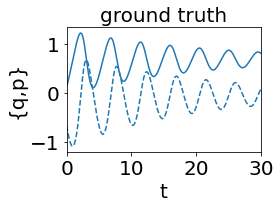

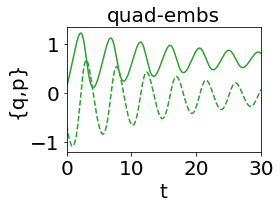

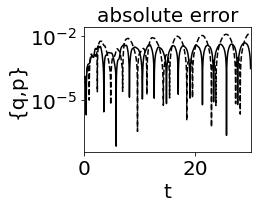

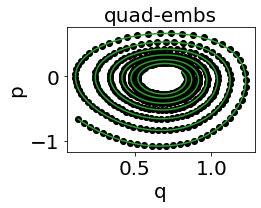

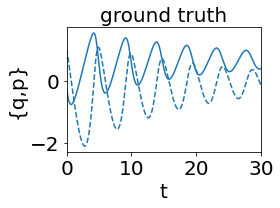

...

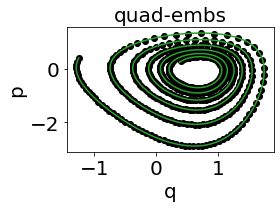

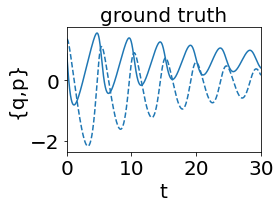

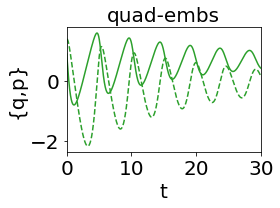

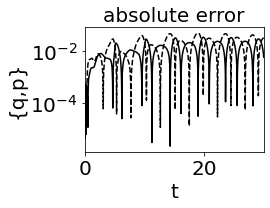

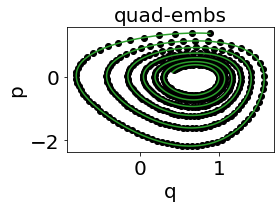

In [12]:
unstable_conf = 0
for i in range(params.Ntest):
    
    t_span = [0, 3*params.t_test]
    t = np.linspace(t_span[0], t_span[1], 20*params.sample_size)

    # define initial condition
    y0_test = np.random.uniform(params.smpling_intl[0], params.smpling_intl[1], 2)

    while (
        np.abs(dyn_model_dissipative.potential(y0_test[0], y0_test[1])) > params.max_potential
    ):
        y0_test = np.random.uniform(
            params.smpling_intl[0], params.smpling_intl[1], 2
        )

    y0_test = torch.tensor(y0_test, dtype=torch.float64)
    encoded_initial = autoencoder.encode(y0_test.to(device)).detach().cpu()

    print("Testing the models for initial conditon:", y0_test.numpy())
    print("Encoded initial condition:              ", encoded_initial.numpy())
    print("=" * 50)

    gt_sol = solve_ivp(dyn_model_dissipative.vector_field, t_span = [t[0], t[-1]], y0 = y0_test, t_eval = t)
    gt_sol = gt_sol.y

        
    ground_truth_sol.append(gt_sol)

    
    latent_sol = solve_ivp(learned_model, t_span = [t[0], t[-1]], y0 = encoded_initial.numpy(), t_eval = t)
    latent_sol = latent_sol.y
    
    if latent_sol.shape[-1] != len(t):
        unstable_conf += 1
        print('WARNING! Instability observed!')
        track_err.append('inf')
        continue
    
    
    latent_sol = torch.tensor(latent_sol, dtype=torch.float64).to(device)
    decoded_latent_sol = autoencoder.decode(latent_sol.T).detach().T.cpu().numpy()
    learned_sol.append(decoded_latent_sol)

    plot.plotting_saving_plots(
        t,
        gt_sol,
        decoded_latent_sol,
        color_idx=color_idx,
        method_name=method_name,
        idx=i,
        path=params.path,
        closing_plts = False
    )
    
    plotting_saving_plots_phasespace(
        gt_sol,
        decoded_latent_sol,
        color_idx=color_idx,
        method_name=method_name,
        idx=i,
        path=params.path,
        closing_plts = False
    )

    temp_err = gt_sol - decoded_latent_sol
    track_err.append(temp_err)
    
print('='*50)
print(f'=== Number of unstable configs: {unstable_conf}')
print('='*50)


In [13]:
learned_sol_stack = np.stack(learned_sol, axis=2)
ground_truth_sol_stack = np.stack(ground_truth_sol, axis=2)

In [14]:
savemat(
    params.path + "sol_trajectories.mat",
    {
        "learned_sol": learned_sol_stack,
        "ground_truth_sol": ground_truth_sol_stack,
        "t": t,
        "err": track_err,
        "unstable_conf": unstable_conf
    },
)

In [15]:
ERRS_MEAN = np.array([(err[0]**2).mean() for err in  track_err])
ERRS_MEAN.mean(), ERRS_MEAN.std()

(9.038427615066441e-05, 0.00019638738000482276)

In [16]:
0.0005

0.0005